# Exploratory data analysis

In [8]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import ipykernel

## Inspect the dataset


In [9]:
data = pd.read_csv("dataBig_300_0.csv")
print(data.head())

   Unnamed: 0                          link   result  white_elo  black_elo  \
0           0  https://lichess.org/T24w2sjS      1-0       1820       1898   
1           4  https://lichess.org/667k2igw  1/2-1/2       1580       1546   
2          14  https://lichess.org/X26rBn5w      0-1       1760       1746   
3          15  https://lichess.org/GbzwEMP9      1-0       1370       1375   
4          16  https://lichess.org/XOVSAmbl      1-0       1833       1419   

   white_rating_diff  black_rating_diff  eco  \
0              174.0               -5.0  D10   
1                0.0                1.0  C50   
2               -6.0                5.0  B90   
3                6.0               -6.0  C62   
4                NaN                NaN  C33   

                                             opening time_control  ...  \
0                                       Slav Defense        300+0  ...   
1            Italian Game: Giuoco Pianissimo, Normal        300+0  ...   
2  Sicilian Defense:

In [10]:
#delete this line if data is proper!
data.drop('Unnamed: 0', axis=1, inplace=True)

Inspect columns' data types and check if there are any null-values. 

In [11]:
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 131703 entries, 0 to 131702
Data columns (total 20 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   link                131703 non-null  object 
 1   result              131703 non-null  object 
 2   white_elo           131703 non-null  int64  
 3   black_elo           131703 non-null  int64  
 4   white_rating_diff   129586 non-null  float64
 5   black_rating_diff   129586 non-null  float64
 6   eco                 131703 non-null  object 
 7   opening             131703 non-null  object 
 8   time_control        131703 non-null  object 
 9   termination         131703 non-null  object 
 10  white_cpl           131703 non-null  int64  
 11  black_cpl           131703 non-null  int64  
 12  white_moves         131703 non-null  int64  
 13  black_moves         131703 non-null  int64  
 14  white_inaccuracies  131703 non-null  int64  
 15  white_mistakes      131703 non-nul

Explore the numerical features.

In [12]:
print(data.describe())

           white_elo      black_elo  white_rating_diff  black_rating_diff  \
count  131703.000000  131703.000000      129586.000000      129586.000000   
mean     1531.382869    1532.724509           2.799693           1.992021   
std       406.167500     406.916362          29.356158          26.339993   
min       400.000000     400.000000        -700.000000        -700.000000   
25%      1230.000000    1230.000000          -6.000000          -6.000000   
50%      1521.000000    1525.000000           1.000000          -1.000000   
75%      1821.000000    1824.000000           6.000000           6.000000   
max      2847.000000    2849.000000         671.000000         703.000000   

           white_cpl      black_cpl    white_moves    black_moves  \
count  131703.000000  131703.000000  131703.000000  131703.000000   
mean     2341.074471    2345.345664      32.809655      32.313554   
std      1781.512198    1773.444310      13.827119      13.824510   
min         0.000000       0.0

Add additional summary statistics for numerical columns.

In [13]:
data['avg_white_cpl'] = data["white_cpl"]/data["white_moves"]
data['avg_black_cpl'] = data["black_cpl"]/data["black_moves"]
data['avg_white_mistakes'] = data["white_mistakes"]/data["white_moves"]
data['avg_black_mistakes'] = data["black_mistakes"]/data["black_moves"]
data['avg_white_blunders'] = data["white_blunders"]/data["white_moves"]
data['avg_black_blunders'] = data["black_blunders"]/data["black_moves"]
data['avg_white_inaccuracies'] = data["white_inaccuracies"]/data["white_moves"]
data['avg_black_inaccuracies'] = data["black_inaccuracies"]/data["black_moves"]

Check rows that include NaN values and investigate causation of its occurence.

In [14]:
data[data.isnull().any(axis=1)]

,link,result,white_elo,black_elo,white_rating_diff,black_rating_diff,eco,opening,time_control,termination,...,black_mistakes,black_blunders,avg_white_cpl,avg_black_cpl,avg_white_mistakes,avg_black_mistakes,avg_white_blunders,avg_black_blunders,avg_white_inaccuracies,avg_black_inaccuracies
4,https://lichess.org/XOVSAmbl,1-0,1833,1419,NaN,NaN,C33,"King's Gambit Accepted: Bishop's Gambit, Lopez...",300+0,Time forfeit,...,0,0,5.875000,5.153846,0.025000,0.000000,0.000000,0.000000,0.000000,0.000000
120,https://lichess.org/YzVqJeJx,1-0,1899,2153,NaN,NaN,D11,Slav Defense: Quiet Variation,300+0,Normal,...,2,1,27.918919,34.305556,0.000000,0.055556,0.027027,0.027778,0.000000,0.138889
138,https://lichess.org/CrrTPQyD,0-1,1739,1814,NaN,NaN,B01,Scandinavian Defense: Modern Variation,300+0,Normal,...,0,1,57.666667,50.100000,0.095238,0.000000,0.095238,0.050000,0.095238,0.100000
210,https://lichess.org/zoIimibK,1-0,2153,2254,NaN,NaN,D37,Queen's Gambit Declined: Barmen Variation,300+0,Normal,...,0,1,15.160000,36.120000,0.000000,0.000000,0.040000,0.040000,0.000000,0.200000
256,https://lichess.org/b7KTQsn4,0-1,1854,1419,NaN,NaN,A10,English Opening: Anglo-Dutch Defense,300+0,Normal,...,0,0,35.619048,6.050000,0.000000,0.000000,0.047619,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
131538,https://lichess.org/wLWaFgbj,1-0,1826,1714,NaN,NaN,E09,"Catalan Opening: Closed Variation, Traditional...",300+0,Normal,...,2,1,10.045455,36.666667,0.000000,0.095238,0.000000,0.047619,0.045455,0.000000
131596,https://lichess.org/EBuTLlA1,1-0,1500,1714,NaN,NaN,B01,Scandinavian Defense: Modern Variation,300+0,Normal,...,2,0,7.966667,30.793103,0.000000,0.068966,0.000000,0.000000,0.000000,0.172414
131628,https://lichess.org/ArxIP3tw,1-0,1419,1209,NaN,NaN,B20,Sicilian Defense: Lasker-Dunne Attack,300+0,Normal,...,0,0,17.562500,21.000000,0.000000,0.000000,0.000000,0.000000,0.062500,0.133333
131684,https://lichess.org/t1MFr78I,0-1,1714,1500,NaN,NaN,B20,Sicilian Defense,300+0,Normal,...,0,0,41.000000,7.900000,0.047619,0.000000,0.047619,0.000000,0.190476,0.050000


## Clean the data

Check whether simultaneous lack of both white and black rating diff comprises 100 per cent of missing values in the dataframe, as that's what appears at first sight.

In [15]:
print(len(data[data.isnull().any(axis=1)]))
print(len(data[data["white_rating_diff"].isnull() & data["black_rating_diff"].isnull()]))

2117
2117


Looking at the output, we can notice that NaN values occur **simultaneously** for both white_rating_diff and black_rating_diff.

In [16]:
print("Percent of null data in white_rating_diff column:", data["white_rating_diff"].isnull().sum() * 100 / len(data["white_rating_diff"]))

Percent of null data in white_rating_diff column: 1.6074045390006302


Since there is only very little amount of missing data, and no reasonable way to impute those accurately, we can **drop** such rows.

In [17]:
data = data.dropna(axis=0)

In [18]:
print(data["result"].unique())

['1-0' '1/2-1/2' '0-1']


Let's inspect the opening column:

In [ ]:
for opening in data.opening.unique():
    print(opening)

In [20]:
print(data.opening.nunique())

2069


As we can see, there's plenty of different openings in chess. In order to make the data more comprehensive and feasible, it would be useful to shorten the names. To do so, it would be reasonable to only include the **main line**, without the specific variations.

In [21]:
data.opening = data.opening.str.split(':').str[0]

In [22]:
print(data.opening.nunique())

142


As we can see, the number of unique values shrunk substantially.

In [23]:
with open("openings.txt", "w", encoding="utf-8") as f:
    for opening in data.opening.unique():
        f.write(opening)
        f.write("\n")


## Data visualization (single features)

In [24]:
y=data["white_moves"].value_counts().to_list()

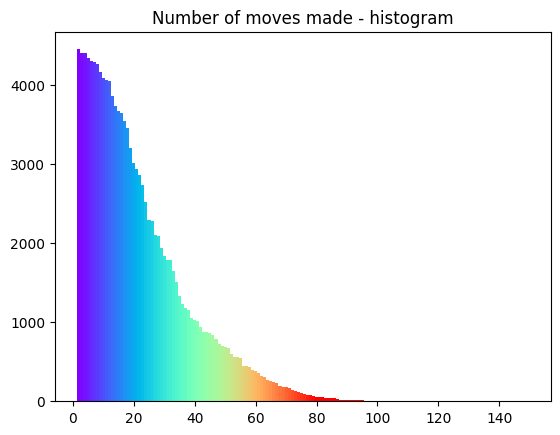

In [25]:
cm = plt.colormaps.get_cmap('rainbow')
x_span = 80-data["white_moves"].min()
x_min = data["white_moves"].min()
C = [cm(((x-x_min)/x_span)) for x in np.sort(data["white_moves"].unique())]
plt.bar(x=np.sort(data["white_moves"].unique()), height=data["white_moves"].value_counts().to_list(), width=1 ,color=C)
plt.title("Number of moves made - histogram")
plt.show()

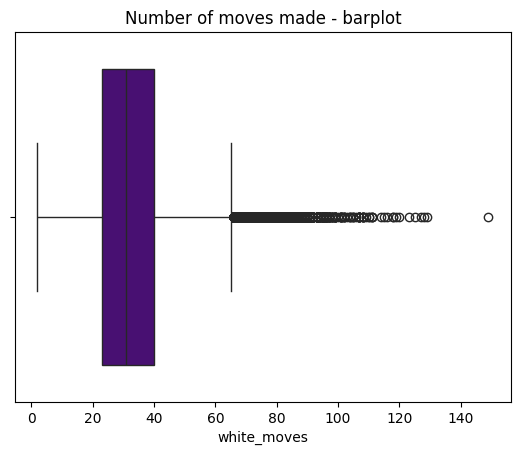

In [26]:
sns.boxplot(x="white_moves", data=data, color="indigo")
plt.title("Number of moves made - barplot")
plt.show()

The above plots indicate that "white_moves" ("black_moves" as well, obviously) has right-skewed distribution with several outliers.

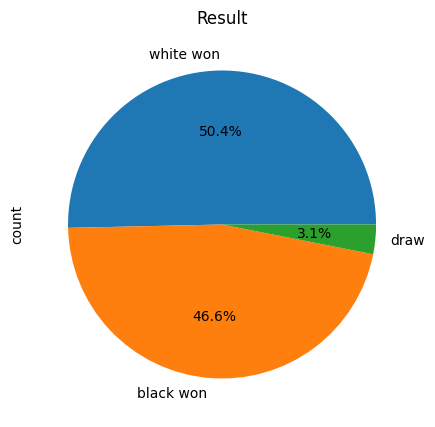

In [27]:
data['result'].value_counts().plot.pie(figsize=(5, 5), autopct='%1.1f%%', legend=False, labels=['white won','black won','draw'])
plt.title("Result")
plt.show()

We can conclude that there is only a small percentage of draws, and that white color slightly outweights the black, which is well-known fact in chess.

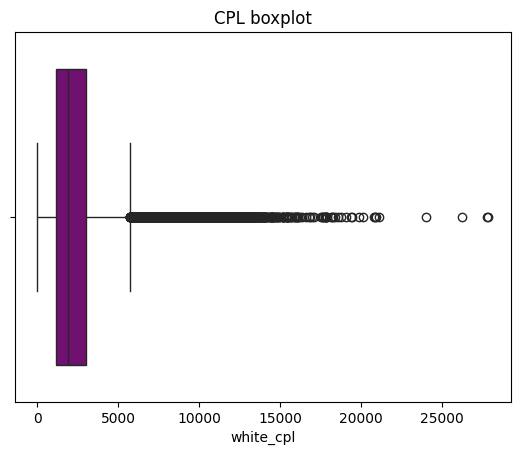

In [28]:
sns.boxplot(x="white_cpl", data=data, color="purple")
plt.title("CPL boxplot")
plt.show()

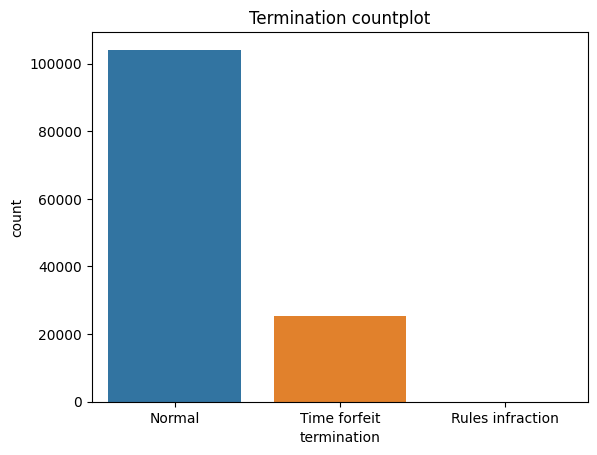

In [29]:
sns.countplot(x='termination', data=data, hue='termination', legend=False)
plt.title("Termination countplot")
plt.show()

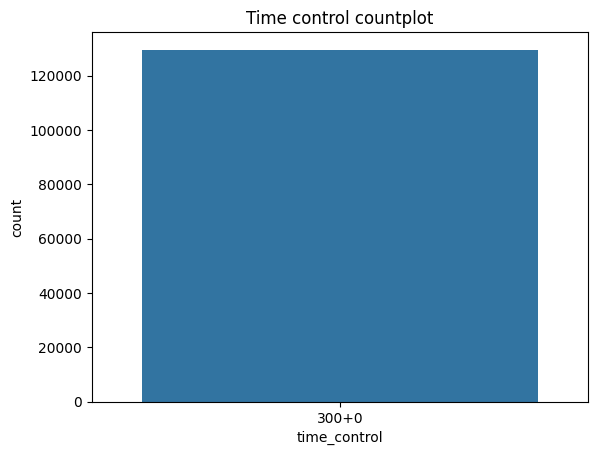

In [30]:
sns.countplot(x='time_control', data=data)
plt.title("Time control countplot")
plt.show()

In [31]:
# Function that puts a desired top openings into pandas series and shows the barplot.
def top_n_openings(n, min_elo=data["white_elo"].min(), max_elo=data["white_elo"].max()):
    d = data[(data["white_elo"] > min_elo) & (data["white_elo"] < max_elo)]
    top_openings = d["opening"].value_counts().iloc[:n]
    # top_openings["other"] = d["opening"].value_counts().iloc[n:].sum()
    sns.barplot(x=top_openings.index, y=top_openings, hue=top_openings.index, legend=False)
    plt.xticks(rotation=60)
    plt.title(f"Top{n} Chess Openings", fontsize=18)
    plt.suptitle(f"{min_elo} - {max_elo} elo")
    plt.show()
    return top_openings

### Let's investigate top 10 openings based on elo:

1. General population:

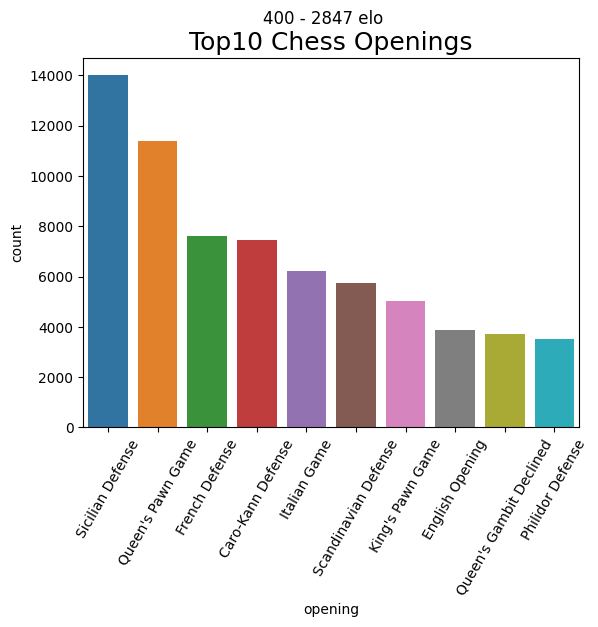

opening
Sicilian Defense           14000
Queen's Pawn Game          11395
French Defense              7619
Caro-Kann Defense           7460
Italian Game                6224
Scandinavian Defense        5739
King's Pawn Game            5016
English Opening             3865
Queen's Gambit Declined     3706
Philidor Defense            3515
Name: count, dtype: int64

In [32]:
top_n_openings(10)

As we can see, the Sicilian Defense is the most popular opening.

2. Players above 1200 elo:

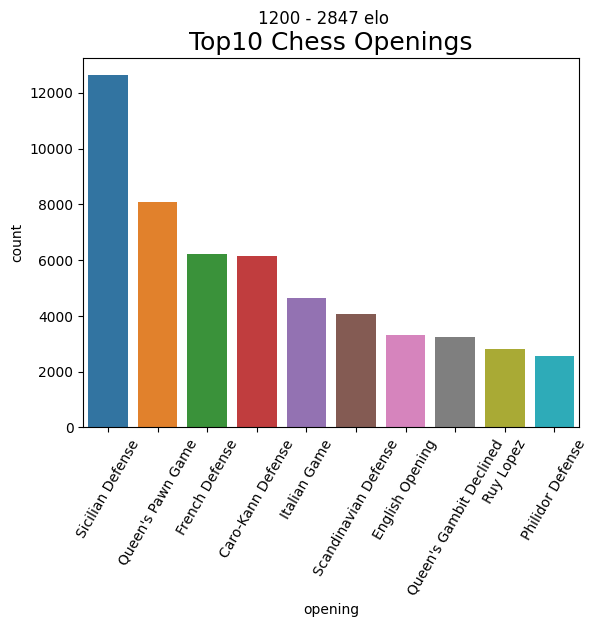

opening
Sicilian Defense           12624
Queen's Pawn Game           8081
French Defense              6214
Caro-Kann Defense           6140
Italian Game                4645
Scandinavian Defense        4068
English Opening             3319
Queen's Gambit Declined     3258
Ruy Lopez                   2829
Philidor Defense            2568
Name: count, dtype: int64

In [33]:
top_n_openings(10, 1200)

3. Players above 1800 elo:

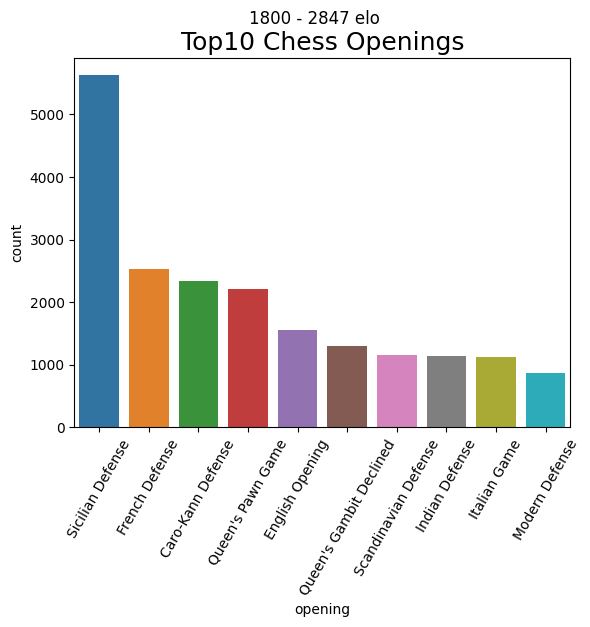

opening
Sicilian Defense           5620
French Defense             2537
Caro-Kann Defense          2336
Queen's Pawn Game          2209
English Opening            1551
Queen's Gambit Declined    1300
Scandinavian Defense       1160
Indian Defense             1141
Italian Game               1129
Modern Defense              876
Name: count, dtype: int64

In [34]:
top_n_openings(10, 1800)

4. Top players - above 2500:

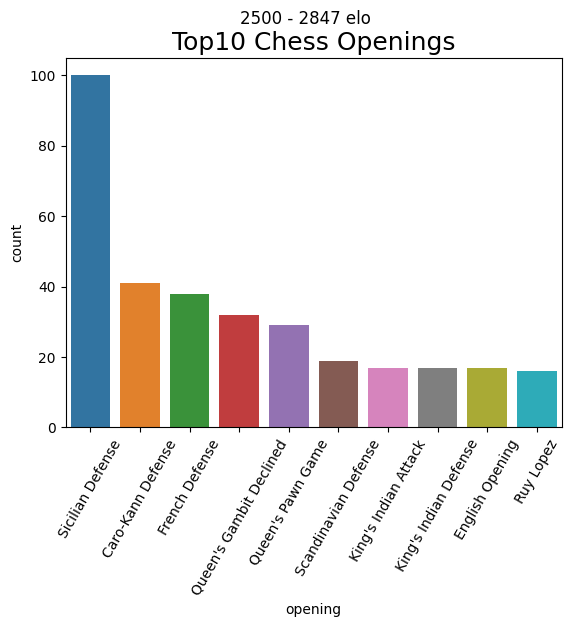

opening
Sicilian Defense           100
Caro-Kann Defense           41
French Defense              38
Queen's Gambit Declined     32
Queen's Pawn Game           29
Scandinavian Defense        19
King's Indian Attack        17
King's Indian Defense       17
English Opening             17
Ruy Lopez                   16
Name: count, dtype: int64

In [35]:
top_n_openings(10, 2500)

5. Low elo - below 1200:

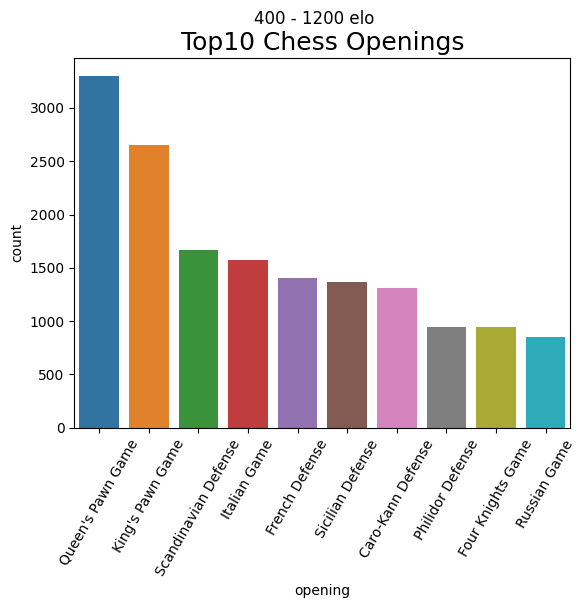

opening
Queen's Pawn Game       3304
King's Pawn Game        2650
Scandinavian Defense    1668
Italian Game            1571
French Defense          1403
Sicilian Defense        1365
Caro-Kann Defense       1314
Philidor Defense         945
Four Knights Game        943
Russian Game             853
Name: count, dtype: int64

In [36]:
top_n_openings(10, max_elo=1200)

6. Intermediate players: 

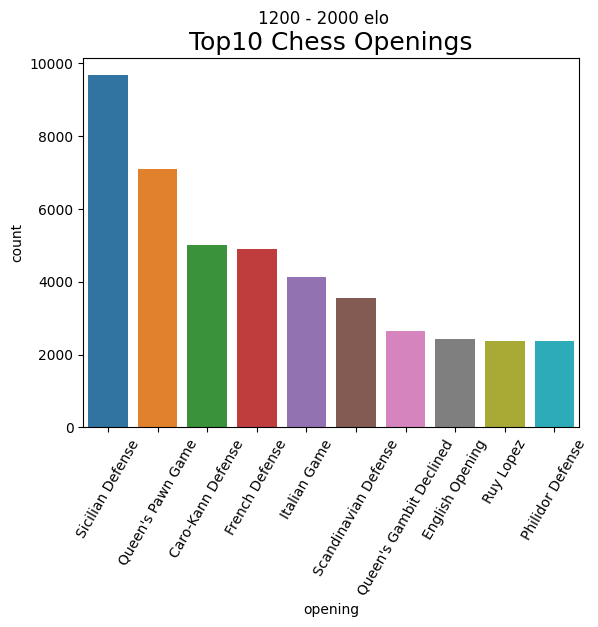

opening
Sicilian Defense           9666
Queen's Pawn Game          7085
Caro-Kann Defense          5002
French Defense             4893
Italian Game               4138
Scandinavian Defense       3559
Queen's Gambit Declined    2638
English Opening            2419
Ruy Lopez                  2370
Philidor Defense           2369
Name: count, dtype: int64

In [37]:
top_n_openings(10, 1200, 2000)

In summary, at low elo levels, the Queen's Pawn opening (1. d4, d5) emerges as the prevailing choice, often followed by some aggressive 1.e4 openings. However, as players' skill levels advance, there is a discernible decline in the popularity of 1.d4 openings. In contrast, there is a notable surge in games initiated with the Sicilian Defense. Remarkably, at the highest echelons of play, the Sicilian Defense takes the lead, being deployed approximately 2.5 times more frequently than its successor.

## Visualizing Multivariate Relationships

> visualizing multiple variables at a time may prove helpful to establish whether there is any association between them.

### Is there an association between elo and average centipawn loss?

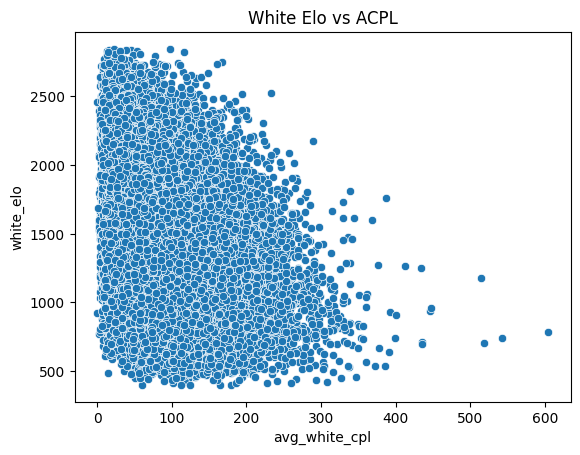

In [38]:
sns.scatterplot(data=data, x="avg_white_cpl", y="white_elo")
plt.title("White Elo vs ACPL")
plt.show()

Looking at the plot above, the conclusion is not obvious. Let's explore further.

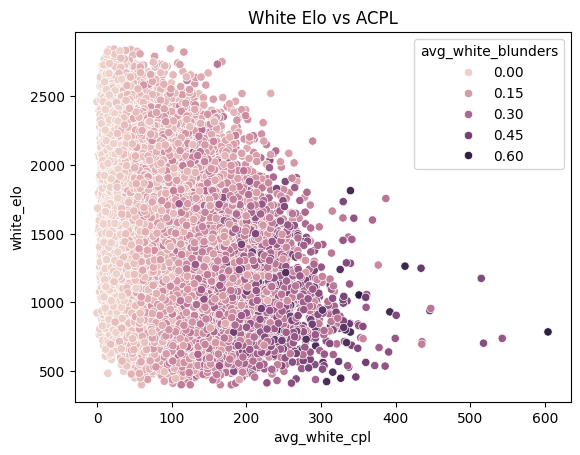

In [39]:
sns.scatterplot(data=data, x="avg_white_cpl", y="white_elo", hue="avg_white_blunders")
plt.title("White Elo vs ACPL")
plt.show()

We can state that higher elo players tend to make less blunders on average and that there are more outliers in terms of ACPL in lower echelons of play. Shall we extract even more information from this data?

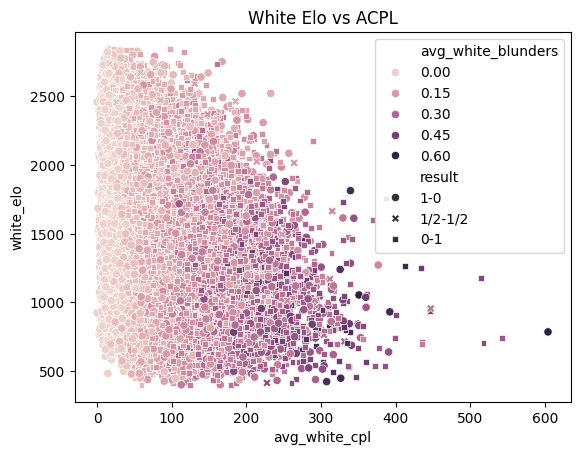

In [40]:
sns.scatterplot(data=data, x="avg_white_cpl", y="white_elo", hue="avg_white_blunders", style="result")
plt.title("White Elo vs ACPL")
plt.show()

Now the plot seems to be overloaded with information. It is hard for human to interpret it reasonably.

### The relationship between those variables seems to be complex. Maybe a 3 dimensional model would give us a better perspective on the problem?

In [49]:
# create 3D scatter plot
fig = px.scatter_3d(data, x='avg_white_cpl', y='avg_black_cpl', z='white_elo', color='white_moves')
fig.show()